# Exercise 8: Sound transformations

In this exercise you will use the HPS model to creatively transform sounds. There are two parts in this exercise. In the first one you should perform a natural sounding transformation on the speech sound that you used in the previous exercise (E7). In the second part you should select a sound of your choice and do a "creative" transformation. You will have to write a short description of the sound and of the transformation you did, giving the link to the original sound and uploading several transformed sounds.

For this exercise, you can use the `transformations_GUI.py` (in `software/transformations_interface/`) to try things, once decided you can fill up the code in this file. You can also do everything from here and add any new code you wish.

In order to perform a good/interesting transformation you should make sure that you have performed an analysis that is adequate for the type of transformation you want to do. Not every HPS analysis representation will work for every type of sound transformation. There will be things in the analysis that when modified will result in undesired artifacts. In general, for any transformation, it is best to have the harmonic values as smooth and continuous as possible and an stochastic representation as smooth and with as few values as possible. It might be much better to start with an analysis representation that does not result in the best reconstruction in exchange of having smoother and more compact data.

To help you with the exercise, we give a brief description of the transformation parameters used by the HPS transformation function:

1. `freqScaling`: frequency scaling factors to be applied to the harmonics of the sound, in time-value pairs (where value of 1 is no scaling). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The scaling factor is a multiplicative factor, thus a value of 1 is no change. Example: to transpose an octave the sound you can specify `[0, 2, 1, 2]`.
2. `freqStretching`: frequency stretching factors to be applied to the harmonics of the sound, in time-value pairs (value of 1 is no stretching). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The stretching factor is a multiplicative factor whose effect depend on the harmonic number, higher harmonics being more affected that lower ones, thus resulting in an inharmonic effect. A value of 1 results in no transformation. Example: an array like `[0, 1.2, 1, 1.2]` will result in a perceptually large inharmonic effect.
3. `timbrePreservation`: 1 preserves the original timbre, 0 does not. It can only have a value of 0 or of 1. By setting the value to 1 the spectral shape of the original sound is preserved even when the frequencies of the sound are modified. In the case of speech it would correspond to the idea of preserving the identity of the speaker after the transformation.
4. `timeScaling`: time scaling factors to be applied to the whole sound, in time-value pairs (value of 1 is no scaling). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The time scaling factor is a multiplicative factor, thus 1 is no change. Example: to stretch the original sound to twice the original duration, we can specify `[0, 0, 1, 2]`.

All the transformation values can have as many points as desired, but they have to be in the form of an array with time-value pairs, so of even size. For example a good array for a frequency stretching of a sound that has a duration of 3.146 seconds could be: `[0, 1.2, 2.01, 1.2, 2.679, 0.7, 3.146, 0.7]`.

## Part 1. Perform natural sounding transformations of a speech sound

Use the HPS model with the sound `speech-female.wav`, available in the sounds directory, to first analyze and then obtain a natural sounding transformation of the sound. The synthesized sound should sound as different as possible to the original sound while sounding natural. By natural we mean that it should sound like speech, that it could have been possible to be produced by a human, and by listening we should consider it as a speech sound, even though we might not be able to understand it. You should first make sure that you start from a good analysis, then you can do time and/or frequency scaling transformations. The transformation should be done with a single pass, no mixing of sounds coming from different transformations. Since you used the same sound in A7, use that experience to get a good analysis, but consider that the analysis, given that we now want to use it for applying a very strong transformation, might be done differently than what you did in A7.

Write a short paragraph for every transformation, explaining what you wanted to obtain and explaining the transformations you did, giving both the analysis and transformation parameter values (sufficiently detailed for the evaluator to be able to reproduce the analysis and transformation).

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd

from smstools.models import utilFunctions as UF
from smstools.models import stft as STFT
from smstools.models import hpsModel as HPS
from smstools.transformations import hpsTransformations as HPST
from smstools.transformations import harmonicTransformations as HT
import IPython.display as ipd

In [3]:
# 1.1 perform an analysis/synthesis using the HPS model

input_file = '../sounds/speech-female.wav'

### set the parameters - Start with the ones from A7
window ='blackman'                          #Good compromise
M = 2000                                    # > 6*44100/150 =  1764                   
N = int(pow(2, np.ceil(np.log2(M))))        # FFT Size, power of 2 larger than M
t = -100                                    #blackman window Bsl=-58. Need more to detect higher harmonics
minSineDur = 0.05                           #From spectrogram 
nH = 100                                     #From sonic visualizer 25, then more to cover all the spectorgram
minf0 = 100                                 #From spectrogram 
maxf0 = 250                                 #From spectrogram 
f0et = 5                                    #>10 which is starting point. Avoid silences to be deteccted as harmonics
harmDevSlope = 0.05                         #Improves
stocf = 0.1

# no need to modify anything after this
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y, yh, yst = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

**Question E8 - 1.2:**

The HPS analysis parameters are chosen to balance accuracy and stability, which will be key in the upcomming transformations. Almost all the parameters have been kept the same as in E7, but there are some changes.

A `Blackman window` is used because it offers a good compromise between main-lobe width and side-lobe attenuation, which is important for harmonic analysis. The analysis window size of `M = 2000` samples exceeds the minimum required to resolve harmonics down to about 150 Hz at a 44.1 kHz sampling rate (remember $ M \geq \frac{6 * 44100}{150} \approx 1764 $), and the FFT size N is set to the next power of two above M to maintain computational efficiency while preserving frequency resolution. 

A magnitude threshold of `–100 dB` is selected to compensate for the Blackman window’s –58 dB side-lobe attenuation and ensure reliable detection of higher harmonics and the number of harmonics is raised in this case compared to the last assignment, in order to capture as much harmonic structure as possible (from `nH = 35`to `nH = 100`). 

The minimum and maximum f0 values (`minf0 = 100 Hz`, `maxf0 = 250 Hz`) constrain the analysis to the pitch range actually present in the signal. The range has been taken from spectrogram inspection using SonicStudio, as well as the minimum `sine duration` of `0.05` s, which ensures that only stable and perceptually meaningful partials are tracked. 

The `f0 error` threshold of `5 Hz` is chosen more conservatively than the typical starting value to avoid misclassifying silence or noise as harmonic. The harmonic deviation slope of 0.05 increases robustness by allowing slight deviations between ideal and measured partial locations, and the stochastic factor `stocf = 0.1` provides a perceptually balanced division between harmonic and noise components in the residual spectrum.
________

#### **Transform 1**

In [4]:
import numpy as np

tremolo_hmag = hmag.copy()
rate = 5.0  # tremolo rate (Hz)   
depth = 0.2 #
numFreqFrames = hmag.shape[0]
frameRate = fs / H  # frames per second

for i in range(numFreqFrames):
    # LFO value (ranges 1–depth)
    lfo = 1.0 + depth * np.sin(2 * np.pi * rate * (i / frameRate))
    tremolo_hmag[i, :] *= lfo

y, yh, yst = HPS.hpsModelSynth(hfreq, tremolo_hmag, hphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))


My first idea was to simulate the voice of an older person. To do this, it is necessary to introduce some instability into the pitch traces, since this is one of the main characteristics of aged voices. In this case, however, it wasn’t necessary to use the `transformations_GUI.py` interface because all we needed was to apply a kind of tremolo to the magnitudes of the detected harmonic tracks. This is exactly what the presented loop does: for each spectral frame, it multiplies the harmonic magnitudes by an LFO that slightly modulates their values. Although the result doesn’t sound completely natural, it does create the impression of an older voice. The main limitation of this loop is that it introduces artifacts from one frame to the next, which produces a kind of airy halo around the voice. It’s worth noting, though, that this also contributes to the perception of age, since older voices tend to be less stable and a bit breathier.
_______

#### **Transform 2**

In [5]:

stable_pitch_freqSc = [0,1,  0.039,0.8,  0.0535,0.8,  0.115,0.8,  0.1437,0.6,  0.21,0.6,  0.292,0.7,  0.46,0.7,  0.53,0.9,   0.6,0.7,  0.61,0.8,  0.67,0.75,   0.7,0.6,   0.745,0.62,   0.75,0.7,  0.925,0.8,  0.95,0.8,  1,1]
stable_cadency_timeSc = [0,0,   0.04,0.03,  0.21,0.24, 0.27,0.25, 0.55,0.58, 0.604,0.604,   0.73,0.74, 1,1]

### define the transformations
freqScaling = np.array(stable_pitch_freqSc)
freqStretching = np.array([0, 1,1,1])
timbrePreservation = 1
timeScaling = np.array(stable_cadency_timeSc)
# no need to modify the following code 
Ns = 512
H = 128

# frequency scaling of the harmonics 
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)
# time scaling the sound
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# synthesis from the trasformed hps representation
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)
ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))


After seeing how difficult it is to perform transformations that sound natural, and, in other words, how easy it is to introduce artifacts when modifying the signal, I decided to try an approach that seems relatively simpler using the `transformations_GUI` interface: simulating a person imitating a robot. To achieve this effect, it is important to preserve the harmonic structure (meaning we do not modify `freqStretching`), but we must alter the pitch so that there is no natural intonation. Instead, the pitch should remain constant throughout the phrase. This is what we accomplished with the array `stable_pitch_freqSc`. After annotating the timestamps corresponding to each syllable, we applied frequency scaling to cancel out the natural pitch contour, producing a more robotic voice.

Once we had a voice that already sounded somewhat robotic (from a prosody point of view), we modified the temporal structure to equalize the pronunciation timing of each group of words. This was done through time scaling, allowing us to also simulate the characteristic rhythmic uniformity of robotic speech. The results are quite positive: there are no major audible artifacts, and the output sounds reasonably natural for a robotic imitation. Some traces of the original intonation are still present, especially toward the end of the audio, and it is challenging to enforce a perfectly constant speaking rhythm due to large pauses in the original recording. However, after the transformations, the overall speaking rate becomes more even and maintains a steady, mechanical pacing throughout the entire recording.

________

#### **Transform 3**

In [6]:
# 1.3 Perform a transformation from the previous analysis

two_people_freqSc =[0,1,  0.039,0.8,  0.0535,0.8,  0.115,0.8,  0.1437,0.6,  0.21,0.6,  0.292,0.7,  0.46,0.8,  0.56,0.8,  0.58,2, 0.73,2.5, 0.74,2, 0.94, 3, 1,3]

two_people_timeSc = [0,0,   0.6, 0.7, 1,1]


### define the transformations
freqScaling = np.array(two_people_freqSc)
freqStretching = np.array([0, 1,1,1])
timbrePreservation = 1
timeScaling = np.array(two_people_timeSc)
# no need to modify the following code 
Ns = 512
H = 128

# frequency scaling of the harmonics 
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)
# time scaling the sound
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# synthesis from the trasformed hps representation
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)
ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

Finally, I was inspired to create two distinct voices from a single recording by transforming the first and second phrases in different ways. The goal was to generate a sort of dialogue: the first voice should sound like an older, tired person delivering sad news, and the second voice should resemble a worried child interrupting by asking, “la vaca! és cega!?”. To achieve this, I kept part of the low, stable intonation from the previous example, but this time I ended the first phrase with a slightly lower pitch to reinforce the older and sad character. For the second phrase (“la vaca és cega”), I shifted the pitch up by about an octave and shaped the contour to sound agitated, concerned, and questioning, with rising intonation endings. Using time-stretching, I slowed down the adult’s line slightly and sped up the child’s part, creating a stronger contrast between the two voices and enhancing the sense of urgency and worry conveyed by the child.
___

## Part 2. Perform creative transformations with a sound of your choice

Pick any natural and harmonic sound from Freesound and use the HPS model to do the most creative and interesting transformation you can come up with. Sounding as different as possible from the original sound.

It is essential that you start with a natural harmonic sound. Examples include (but not limited to) any acoustic harmonic instrument, speech, harmonic sound from nature, etc. As long as they have a harmonic structure, you can use it. You can even reuse the sound you used in A7-Part2 or upload your own sound to freesound and then use it.

The sound from Freesound to use could be in any format, but to use the sms-tools software you will have to first convert it to be a monophonic file (one channel), sampling rate of 44100, and 16bits samples.

You can do any interesting transformation with a single pass. It is not allowed to mix sounds obtained from different transformations. The transformed sound need not sound natural. So, time to show some creativity!

Write a short paragraph for every transformation, explaining what you wanted to obtain and explaining the transformations you did, giving both the analysis and transformation parameter values (sufficiently detailed for the evaluator to be able to reproduce the analysis and transformation).

In [7]:
from pydub import AudioSegment

input_file = "/home/ibroto/Documents/UPF_SMC/DSP/256595__aberrian__uke_single_notes.wav"
new_file_name = "/home/ibroto/Documents/UPF_SMC/DSP/256595__aberrian__uke_single_notes-mono.wav"

sound = AudioSegment.from_wav(input_file)
sound = sound.set_channels(1)
sound.export(new_file_name, format="wav")


(fs, x) = UF.wavread(new_file_name)
print('Original audio converted to mono:')
ipd.display(ipd.Audio(data=x, rate=fs))

t1 = 0
s1 = int(t1*fs)
t2 = 5
s2 = int(t2*fs)
x = x[s1:s2]

print('Cropped mono audio (5 sec):')
ipd.display(ipd.Audio(data=x, rate=fs))


Original audio converted to mono:


/home/ibroto/anaconda3/envs/SMCPompeuBase/lib/python3.12/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Cropped mono audio (5 sec):


In [11]:
# 2.1 perform an analysis/synthesis using the HPS model

### set the parameters
input_file = new_file_name
window = 'blackman'                         #good time-freq compromise
M = 900                                     # >= Bsl*fs/minF0 = 6*44100/300 = 882
N = int(pow(2, np.ceil(np.log2(M))))        # FFT Size, power of 2 larger than M
t = -100                                     # Bsl of blackman window is -58dB.. Needed to put it higt¡her
minSineDur = 0.2                            # Based on spectrogram. Shortest note (5th) is around this legth
nH = 20                                     # based on spect. With 15 the residual sounded like a pitched bell
minf0 = 280                                 # Based on spectrogram
maxf0 = 550                                 # Based on spectrogram 
f0et = 10                                   # Starts big and make small
harmDevSlope = 0.02                        #Common value
stocf = 0.05                               #Common value changed to 0.01 to avoid smokey reverb effect on 2nd and 7th note


# no need to modify anything after this
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y, yh, yst = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

**Question E8 2.2:**

Given the fact I had already worked with this sound, I used the parameters I used for the previous analysis, and since they work fine, I decided to keep them throughout the transformation. It follows an explanation of each:


- The `Blackman window` is chosen because it offers a good time–frequency compromise for capturing the ukulele’s harmonic structure. 
- The analysis window size `M = 900` satisfies the requirement $M≥6⋅44100300≈882M \geq \frac{6 \cdot 44100}{300} \approx 882M≥3006⋅44100​≈882$, ensuring adequate resolution for detecting a minimum `f0` of about `300 Hz`. 
- The FFT size N is set to the next power of two above M to retain frequency resolution while keeping the computation efficient.
- A threshold of `–100 dB` is used because the Blackman window’s –58 dB sidelobe level demands a much lower cutoff to reliably capture the weaker upper harmonics.
- The `minimum sine duration` of `0.2`s is chosen based on the spectrogram, matching the length of the shortest note so that only stable ukulele partials are tracked. 
- The number of harmonics, `nH = 20`, is selected from spectrogram inspection, since using only 15 harmonics caused the residual to sound more like a pitched bell than a natural ukulele decay.
- The `minf0 = 280 Hz` and `maxf0 = 550 Hz` parameters are set directly from the observed pitch range in the spectrogram. 
- The `f0 error` threshold of `10 Hz` is kept deliberately wide to allow the estimation to stabilize before tightening, resulting in more reliable tracking. 
- The harmonic deviation slope, `harmDevSlope = 0.05`, provides a standard level of flexibility for small shifts between ideal and measured harmonic positions. 
- Finally, the stochastic factor `stocf = 0.2` is changet to 0.2 due to algorithmic limtitations, but still kept small in order to reduce as much as possible the “smokey” artifacts previously heard in the second and seventh notes, yielding a cleaner ukulele residual. Note that the original sound already has some backgound noise, which we will still percieve after the analysis.

___

In [12]:
# 2.3 Perform a transformation from the previous analysis

### define the transformations
freqScaling = np.array([0,1,  0.042,1,  0.105,1.5,  0.122,1,0.197,1.5,  0.206,1,   0.422,1.5,   0.443,1,   0.631,1, 0.633,1.2,  0.635,1, 0.637,0.8, 0.639,1, 0.641,1.2, 0.643,1, 0.645,0.8, 0.647,1, 0.649,1.2, 0.651,1, 0.653,0.8, 0.655,1, 0.657,1.2, 0.659,1, 0.661,0.8, 0.665,1, 0.669,1.2, 0.673,1,  0.923,0.5,   1,0.5])
freqStretching = np.array([0,1, 0.443,1,  0.72,1, 0.923,0.9,   1,0.9])
timbrePreservation = 0 #sounds more elastic
timeScaling = np.array([0,0, 0.443,0.443,   0.63, 0.517, 0.631,0.69, 1,1])


# no need to modify anything after this
Ns = 512
H = 128

# frequency scaling of the harmonics 
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)

# time scaling the sound
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# synthesis from the trasformed hps representation 
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

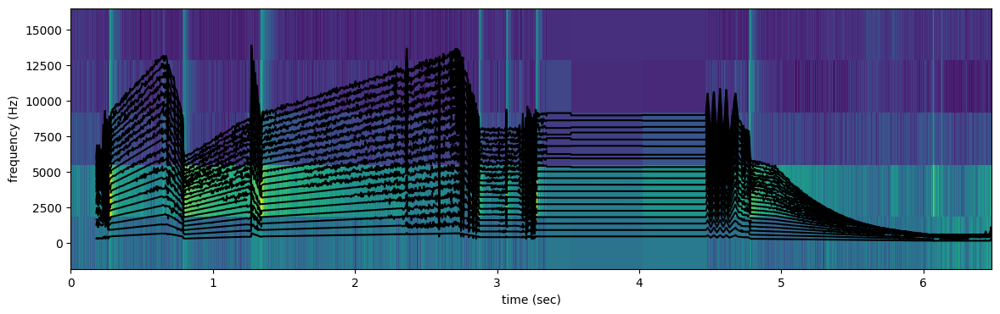

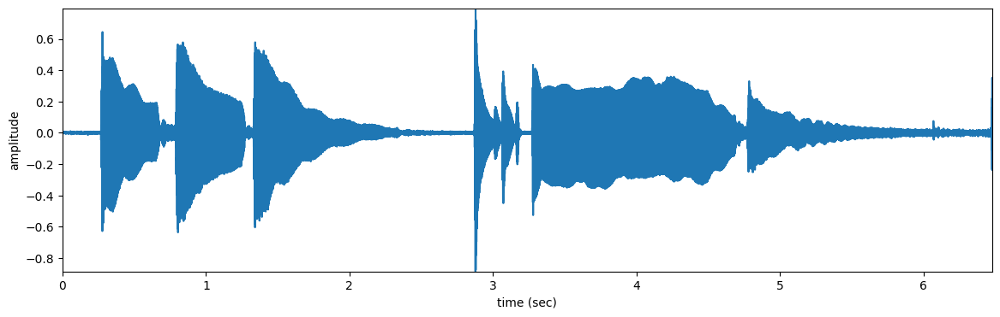

In [13]:
#create figure to plot
plt.figure(figsize=(14, 4))
# frequency range to plot
maxplotfreq = 15000.0

# plot spectrogram stochastic compoment
numFrames = int(ystocEnv[:, 0].size)
sizeEnv = int(ystocEnv[0, :].size)
frmTime = H * np.arange(numFrames) / float(fs)
binFreq = (0.5 * fs) * np.arange(sizeEnv * maxplotfreq / (0.5 * fs)) / sizeEnv
plt.pcolormesh(frmTime, binFreq, np.transpose(ystocEnv[:, : int(sizeEnv * maxplotfreq / (0.5 * fs)) + 1]))
plt.autoscale(tight=True)
# plot harmonic on top of stochastic spectrogram
harms = yhfreq * np.less(yhfreq, maxplotfreq)
harms[harms == 0] = np.nan
numFrames = int(harms[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)
plt.plot(frmTime, harms, color="k", ms=3, alpha=1)
plt.xlabel("time (sec)")
plt.ylabel("frequency (Hz)")
plt.autoscale(tight=True)
plt.show()

# plot the output sound
plt.figure(figsize=(14, 4))
plt.plot(np.arange(y.size) / float(fs), y)
plt.axis([0, y.size / float(fs), min(y), max(y)])
plt.ylabel("amplitude")
plt.xlabel("time (sec)")
plt.show()

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

**Question E8 - 2.4:**



For this experiment, I used the same ukulele sound from the previous assignment because I was already familiar with the sound and it contains several distinct notes, allowing for different transformations to them. Since the ukulele is a string instrument, I wanted to explore transformations that evoke the flexibility of vibrating strings, modifying how this flexibility behaves as tension increases up to the point where the string seems to “disconnect”. Also, after the experimentation stage with the speech sound, I've realized how well this kind of transformations evoke this sliding/"chirpy" variations, so I think it's convinient to explore this kind of sounds at the creative stage.

In the first two notes, I applied a pitch increase that is perceived somehow as a "slide" along the instrument’s neck, bending of the string, or as pulling on a string while it is resonating. For the third note, I wanted the same expressive bending effect but slightly longer and more prominent, so I used time stretching to extend it. Those three tones resamble as well a slide wwhistle, evoking this sense of movement and elasticity. After this, I changed the dynamic by introducing two short tones that act almost like “checks,” testing whether the string is ready for the sixth note. For this final sustained note, I used time stretching to hold it steady, which makes it sound almost like a different instrument, since the residual pluck of the ukulele disappears completely at the steady stage and we "perceptually forget" about it. At the end of this suspended tension, I added pitch vibrations meant to simulate a string getting disconnected and loose, until in the last note everything collapses. For this I lowered the pitch and applied frequency stretching, which breaks the harmonic structure and gives a clear sense of finality to the clip. I chose not to preserve the timbre, because removing timbre preservation creates a more elastic quality that better conveys the feeling of a string being stretched and bent.

___
